In [1]:
import os
import pandas as pd
import json
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
from wordcloud import WordCloud

In [2]:
# 设置中文字体
plt.rcParams['font.sans-serif'] = ['SimHei']  # 用来正常显示中文
plt.rcParams['axes.unicode_minus'] = False     # 用来正常显示负号

In [3]:
def load_json_data(filename='电影详情/movies.json'):
    """加载JSON数据"""
    with open(filename, 'r', encoding='utf-8') as f:
        return json.load(f)

In [4]:
def read_comments_from_file(file_path):
    """从CSV文件中读取短评内容"""
    df = pd.read_csv(file_path)
    if '短评内容' in df.columns:
        return ' '.join(df['短评内容'].dropna().tolist())
    else:
        return ''

In [15]:
def generate_wordcloud(text, output_filename, font_path):
    """生成并保存词云图"""
    wordcloud = WordCloud(width=800, height=600, 
                          background_color='white',
                          font_path=font_path).generate(text)
    
    # 显示词云图
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')  # 不显示坐标轴
    plt.show()

    # 保存词云图到指定文件夹
    wordcloud.to_file(output_filename)
    print(f"词云图已保存为 '{output_filename}'")

In [6]:
def extract_title_before_space(title):
    """提取电影标题中空格前的部分"""
    return title.split(' ')[0]  # 取空格前的部分

In [7]:
def process_countries(movies):
    """处理国家数据"""
    # 分割和统计国家
    all_countries = []
    for movie in movies:
        countries = [c.strip() for c in movie['countries'].split('/')]
        all_countries.extend(countries)
    
    country_counts = Counter(all_countries)
    
    # 计算总数
    total = sum(country_counts.values())
    
    # 过滤掉低于0.5%的国家
    filtered_country_counts = {country: count for country, count in country_counts.items() if (count / total) >= 0.005}
    
    return filtered_country_counts

In [8]:
def process_genres(movies):
    """处理电影类型数据"""
    all_genres = []
    for movie in movies:
        all_genres.extend(movie['genres'])
    
    return Counter(all_genres)

In [9]:
def process_ratings(movies):
    """处理评分数据"""
    rating_ranges = {
        '0-2': 0, '2-4': 0, '4-6': 0,
        '6-8': 0, '8-10': 0
    }
    
    for movie in movies:
        try:
            rating = float(movie['rating'])
            if 0 <= rating <= 2:
                rating_ranges['0-2'] += 1
            elif 2 < rating <= 4:
                rating_ranges['2-4'] += 1
            elif 4 < rating <= 6:
                rating_ranges['4-6'] += 1
            elif 6 < rating <= 8:
                rating_ranges['6-8'] += 1
            elif 8 < rating <= 10:
                rating_ranges['8-10'] += 1
        except ValueError:
            continue
    
    return rating_ranges

In [19]:
def categorize_movies_by_genre(json_data, folder_path, font_path, output_folder):
    """根据电影类型分类，并生成每个类型的电影对应的词云图"""
    genre_comments = defaultdict(str)  # 用于存储每个类型的所有短评内容
    all_comments = ""  # 存储所有电影的短评内容
    
    # 遍历JSON中的每部电影
    for movie in json_data:
        title = movie['title']
        title_before_space = extract_title_before_space(title)  # 获取空格前的标题
        movie_genres = movie.get('genres', [])
        
        # 匹配CSV文件
        csv_filename = f"{title_before_space} 短评.csv"  # 使用空格前的标题匹配CSV文件
        csv_filepath = os.path.join(folder_path, csv_filename)
        
        if os.path.exists(csv_filepath):
            # 从CSV文件中读取短评内容
            comments = read_comments_from_file(csv_filepath)
            
            # 将短评内容添加到所有电影的短评内容中
            all_comments += ' ' + comments
            
            # 将短评内容添加到相应类型的类别中
            for genre in movie_genres:
                genre_comments[genre] += ' ' + comments
    
    # 生成整体的词云图
    if all_comments:
        output_filename = os.path.join(output_folder, '所有电影_词云图.png')
        generate_wordcloud(all_comments, output_filename, font_path)
    
    # 为每个类型生成词云图
    for genre, comments in genre_comments.items():
        if comments:  # 如果该类型有短评内容
            output_filename = os.path.join(output_folder, f"{genre}_词云图.png")
            generate_wordcloud(comments, output_filename, font_path)

In [17]:
def create_visualizations(movies, output_folder):
    """创建可视化图表"""
    # 1. 国家/地区饼图
    countries_data = process_countries(movies)
    plt.figure(figsize=(8, 6))
    countries = list(countries_data.keys())
    values = list(countries_data.values())
    
    plt.pie(values, labels=countries, autopct='%1.1f%%')
    plt.title('电影制片国家/地区分布')
    plt.savefig(os.path.join(output_folder, '国家地区分布.png'), dpi=300, bbox_inches='tight')
    print("国家地区分布图已保存为 '国家地区分布.png'")

    # 2. 类型柱状图
    genres_data = process_genres(movies)
    plt.figure(figsize=(8, 6))
    genres = list(genres_data.keys())
    counts = list(genres_data.values())
    
    bars = plt.bar(genres, counts)
    plt.title('电影类型分布')
    plt.xticks(rotation=45)
    
    # 在柱状图上添加数值标签
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{int(height)}',
                 ha='center', va='bottom')
    
    plt.savefig(os.path.join(output_folder, '电影类型分布.png'), dpi=300, bbox_inches='tight')
    print("电影类型分布图已保存为 '电影类型分布.png'")

    # 3. 评分折线图
    ratings_data = process_ratings(movies)
    plt.figure(figsize=(8, 6))
    
    x = list(ratings_data.keys())
    y = list(ratings_data.values())
    
    plt.plot(x, y, marker='o')
    plt.title('电影评分分布')
    
    # 在折线图上添加数值标签
    for i, v in enumerate(y):
        plt.text(i, v, str(v), ha='center', va='bottom')
    
    plt.grid(True)
    plt.savefig(os.path.join(output_folder, '电影评分分布.png'), dpi=300, bbox_inches='tight')
    print("电影评分分布图已保存为 '电影评分分布.png'")

In [14]:
def main():
    folder_path = '电影短评'  # 文件夹路径，替换为实际的路径
    json_file = '电影详情/movies.json'  # JSON文件路径，替换为实际路径
    font_path = 'C:/Windows/Fonts/simhei.ttf'  # 设置字体路径
    output_folder = '可视化'  # 可视化文件夹路径
    
    # 确保可视化文件夹存在
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # 加载JSON数据
    json_data = load_json_data(json_file)
    
    # 创建可视化
    create_visualizations(json_data, output_folder)
    
    # 根据JSON中的电影类型分类并生成词云图
    categorize_movies_by_genre(json_data, folder_path, font_path, output_folder)

国家地区分布图已保存为 '国家地区分布.png'
电影类型分布图已保存为 '电影类型分布.png'
电影评分分布图已保存为 '电影评分分布.png'


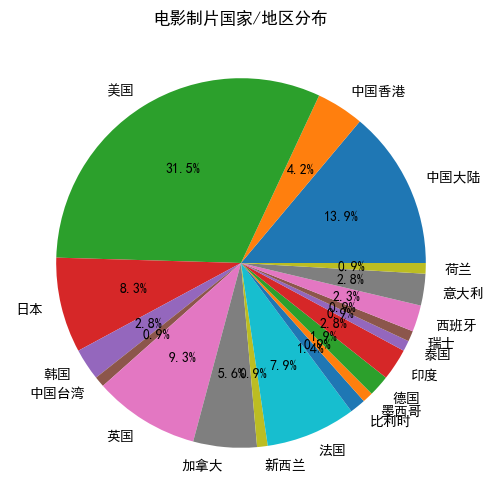

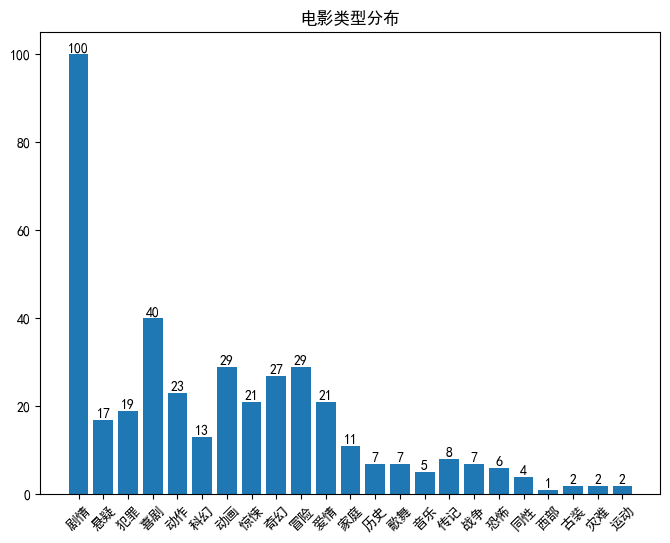

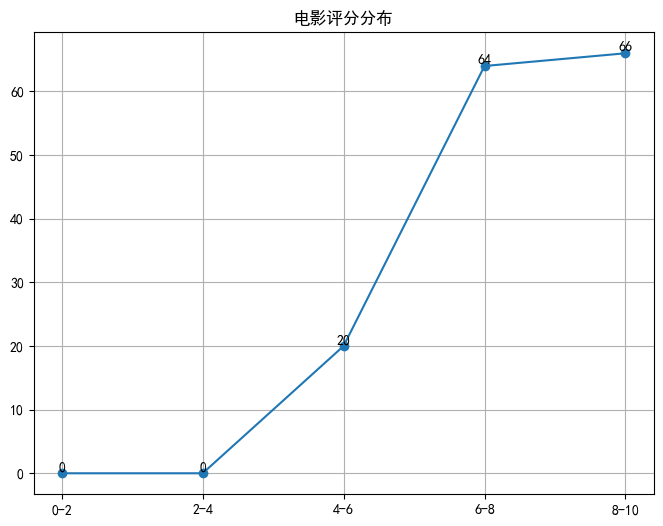

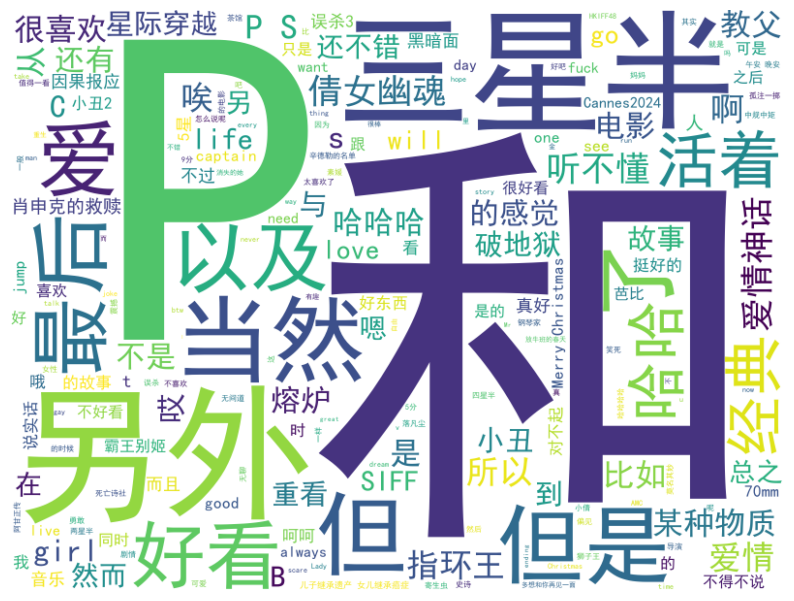

词云图已保存为 '可视化\所有电影_词云图.png'


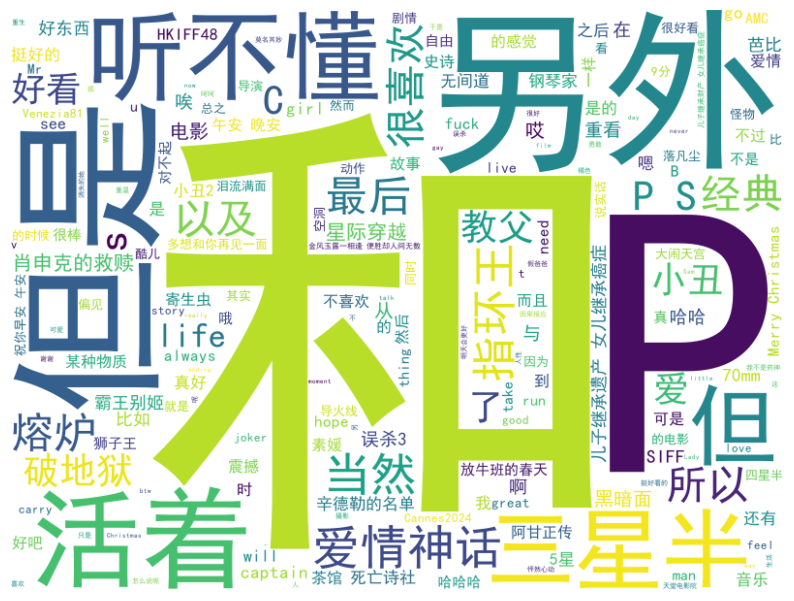

词云图已保存为 '可视化\剧情_词云图.png'


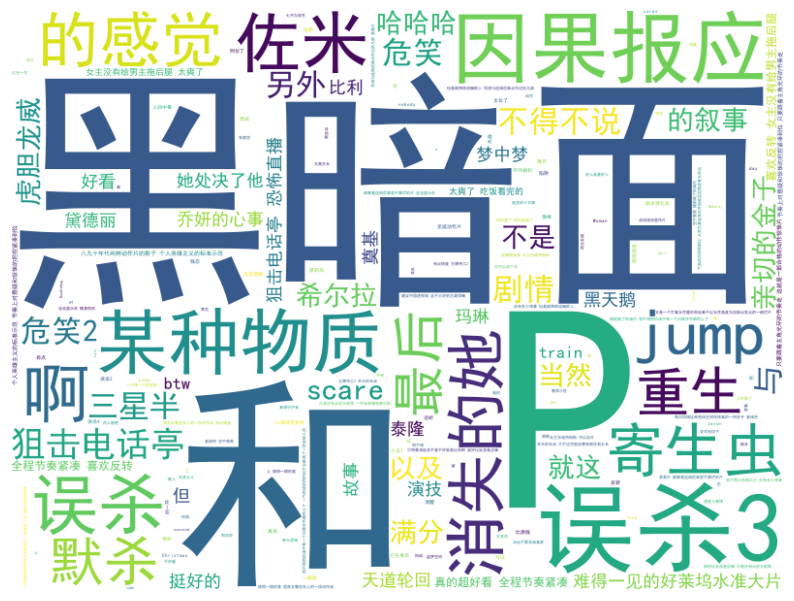

词云图已保存为 '可视化\悬疑_词云图.png'


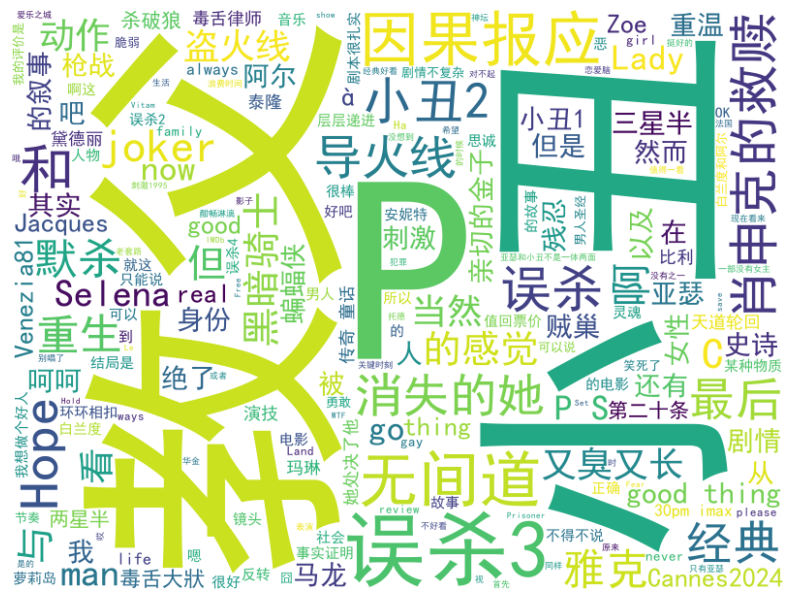

词云图已保存为 '可视化\犯罪_词云图.png'


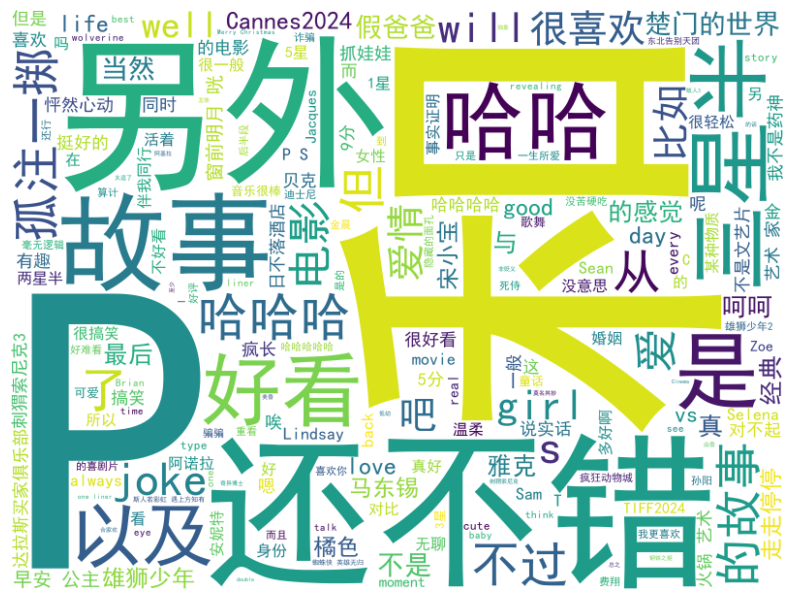

词云图已保存为 '可视化\喜剧_词云图.png'


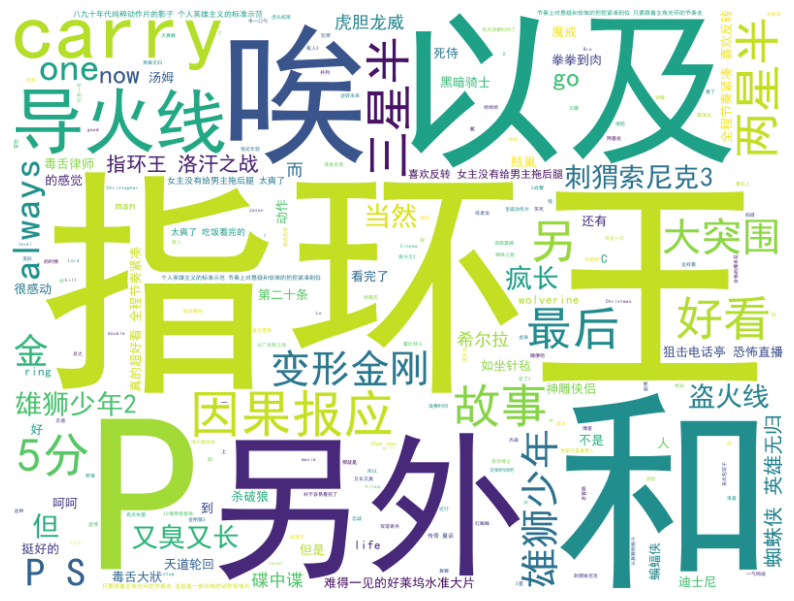

词云图已保存为 '可视化\动作_词云图.png'


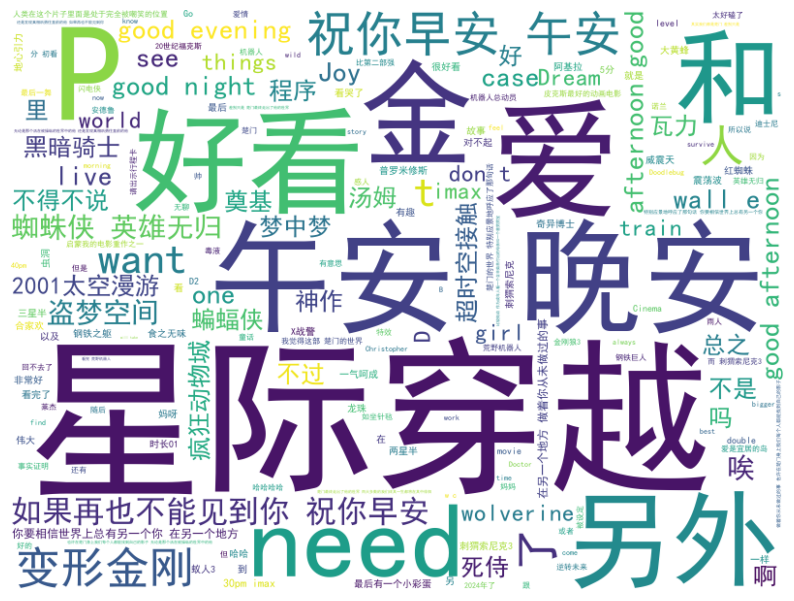

词云图已保存为 '可视化\科幻_词云图.png'


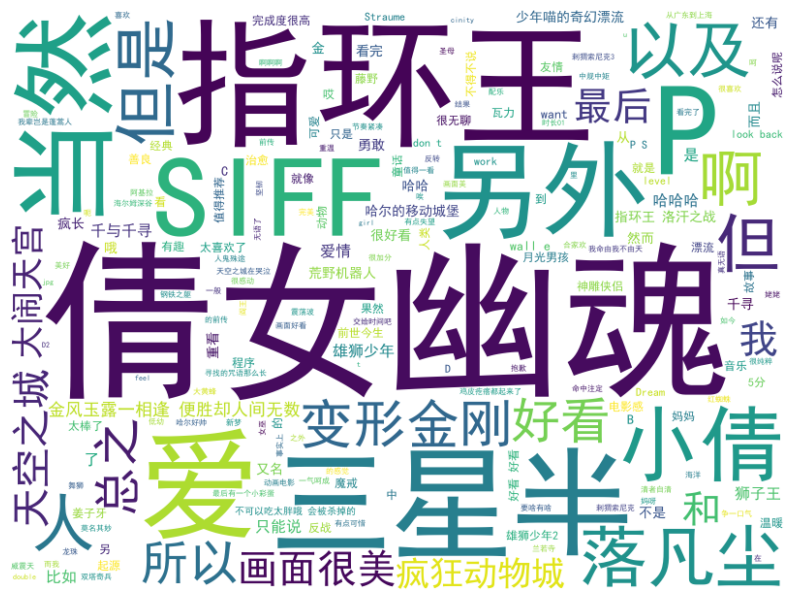

词云图已保存为 '可视化\动画_词云图.png'


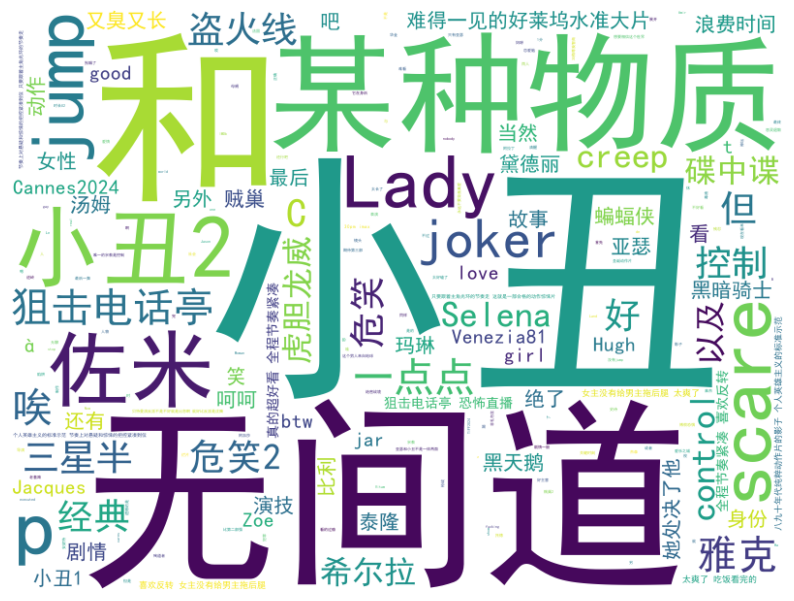

词云图已保存为 '可视化\惊悚_词云图.png'


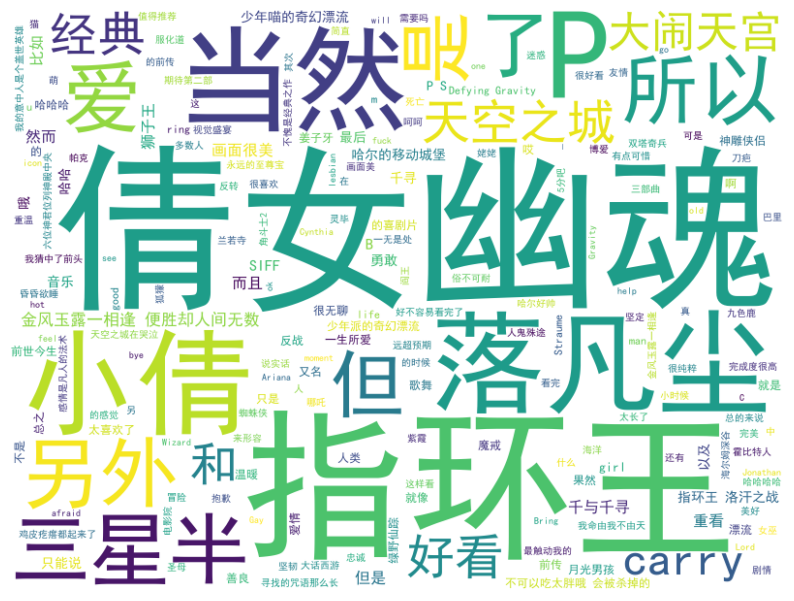

词云图已保存为 '可视化\奇幻_词云图.png'


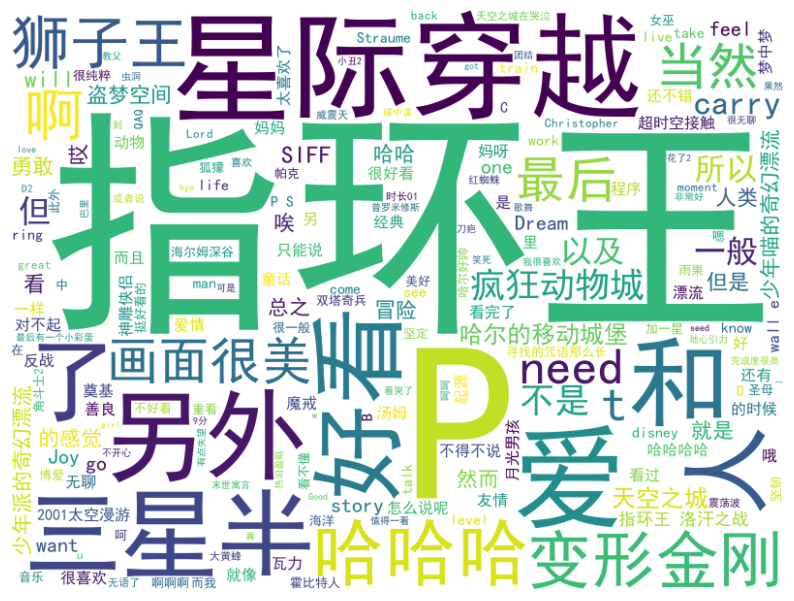

词云图已保存为 '可视化\冒险_词云图.png'


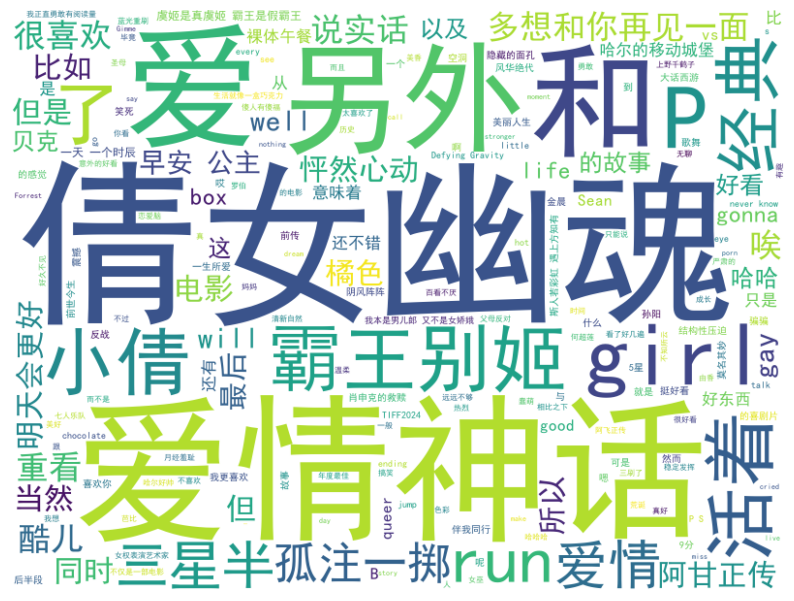

词云图已保存为 '可视化\爱情_词云图.png'


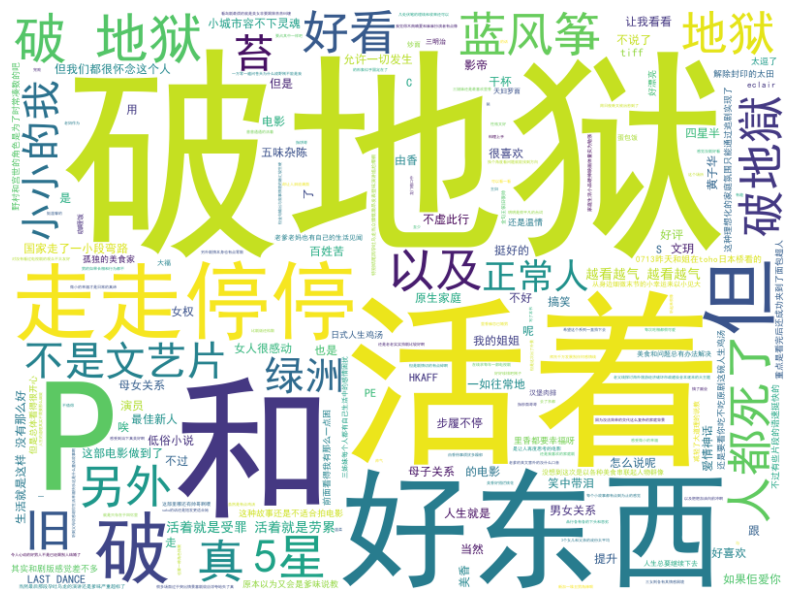

词云图已保存为 '可视化\家庭_词云图.png'


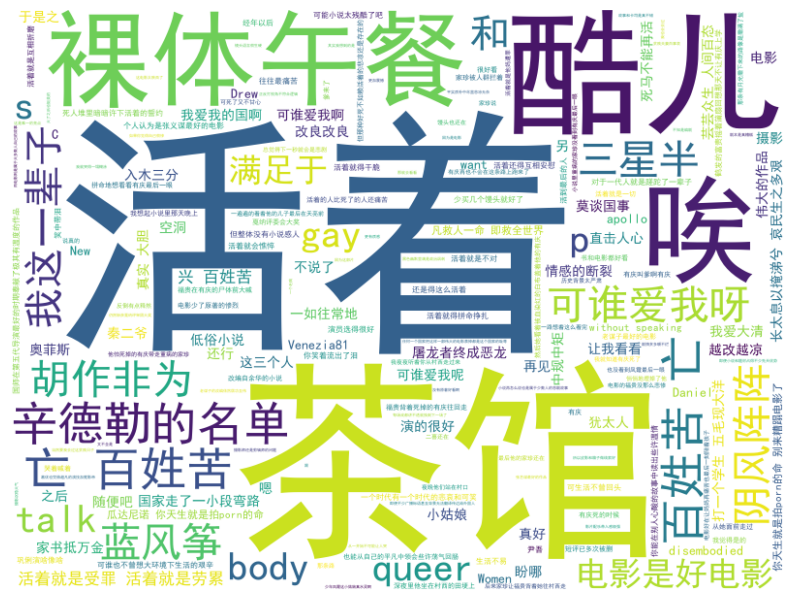

词云图已保存为 '可视化\历史_词云图.png'


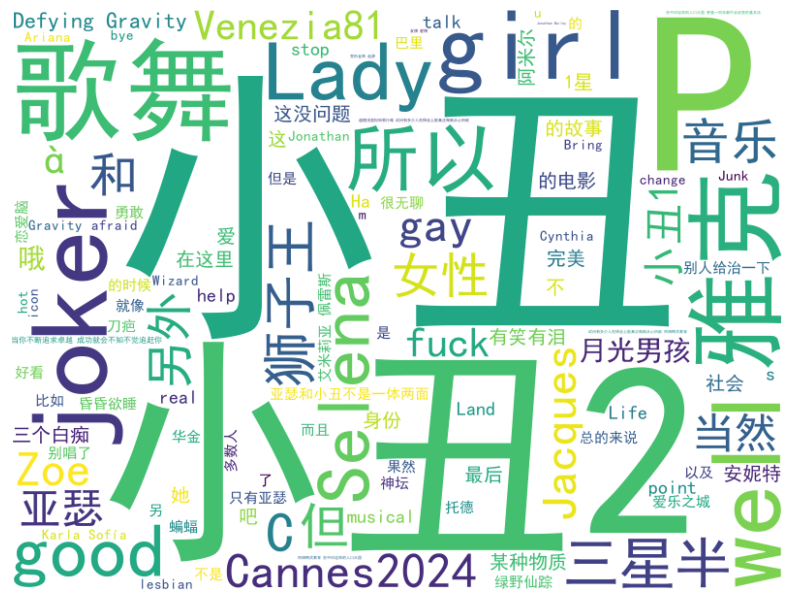

词云图已保存为 '可视化\歌舞_词云图.png'


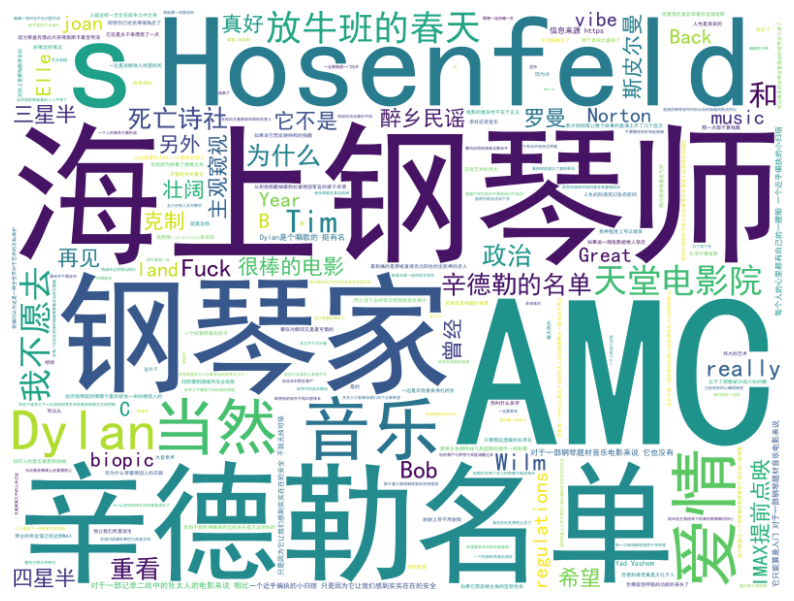

词云图已保存为 '可视化\音乐_词云图.png'


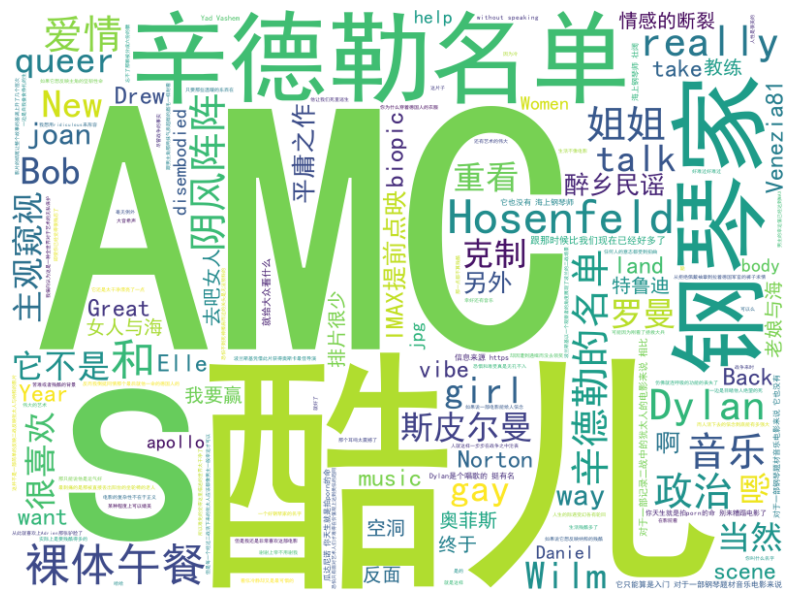

词云图已保存为 '可视化\传记_词云图.png'


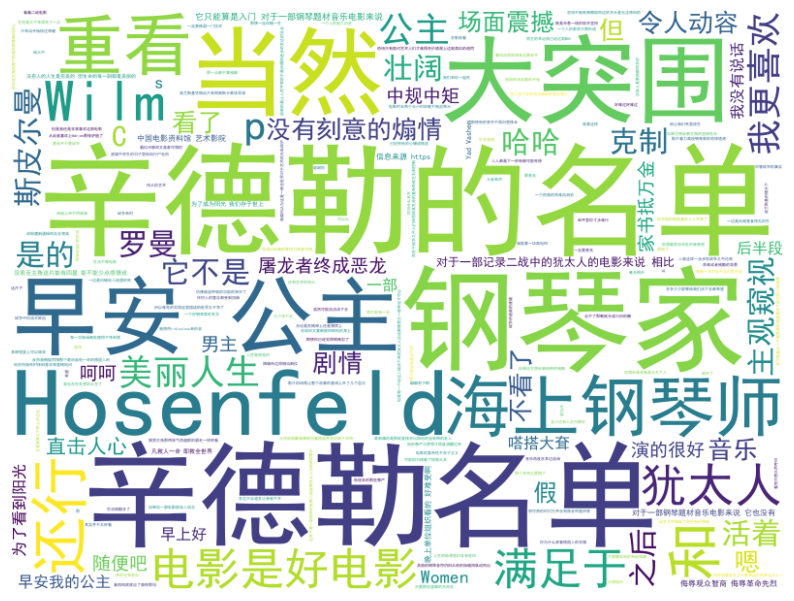

词云图已保存为 '可视化\战争_词云图.png'


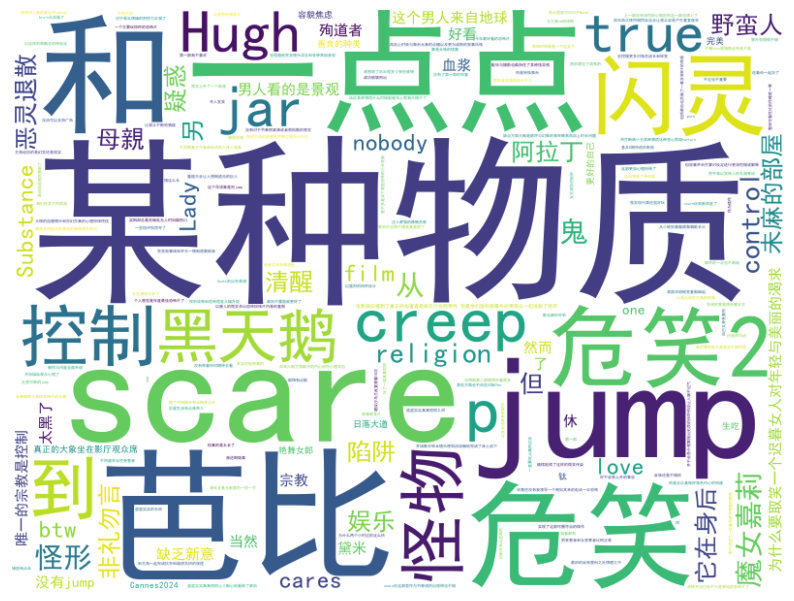

词云图已保存为 '可视化\恐怖_词云图.png'


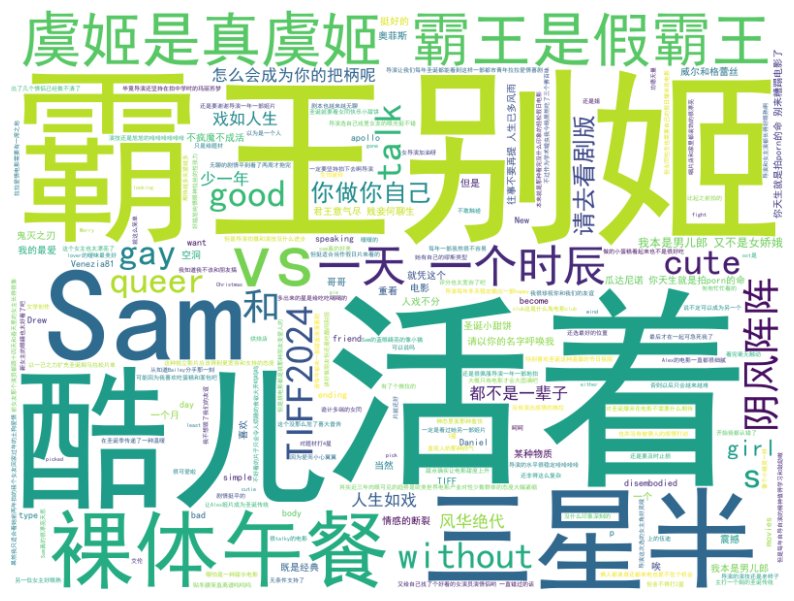

词云图已保存为 '可视化\同性_词云图.png'


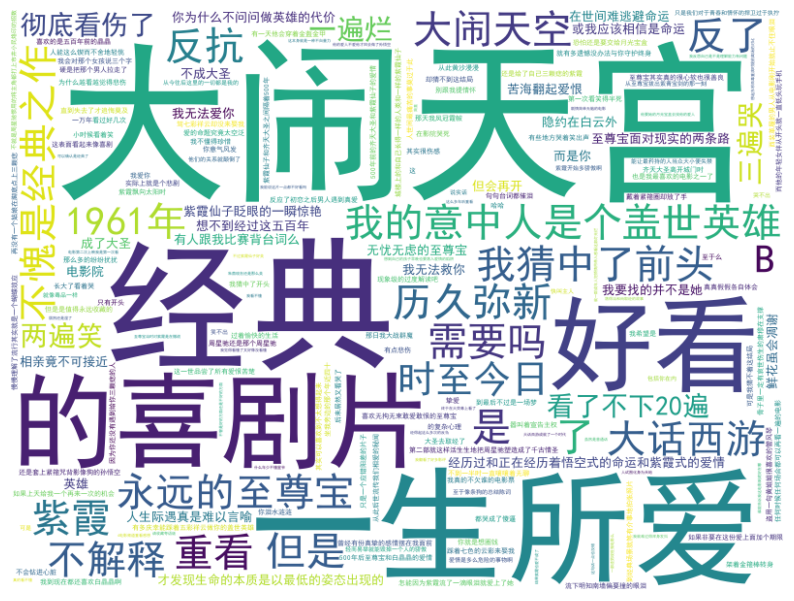

词云图已保存为 '可视化\古装_词云图.png'


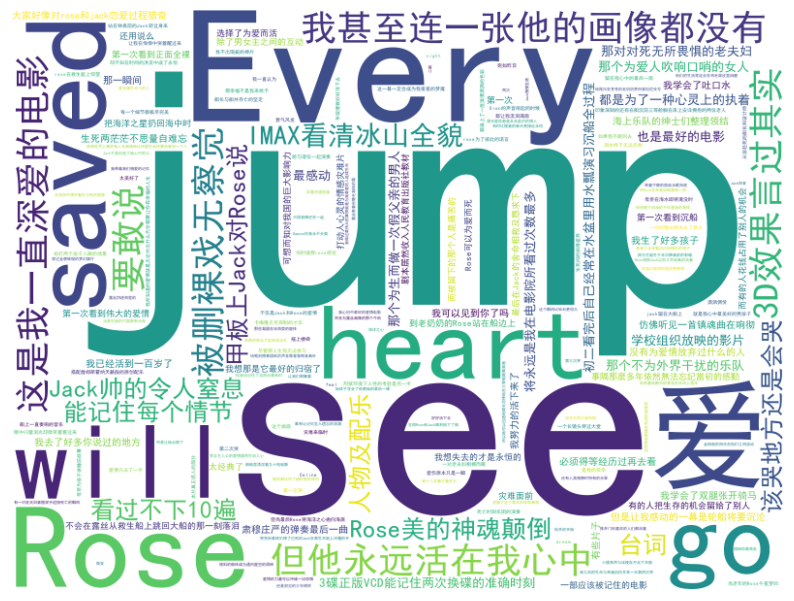

词云图已保存为 '可视化\灾难_词云图.png'


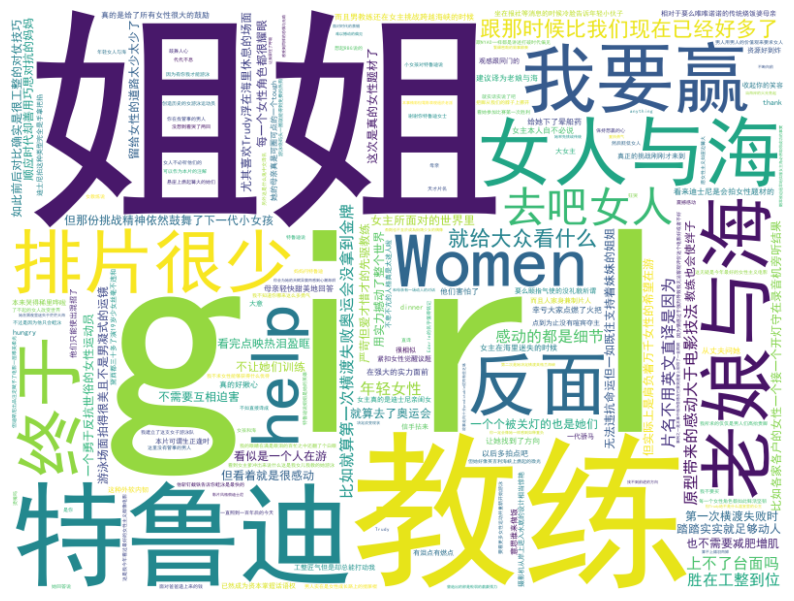

词云图已保存为 '可视化\运动_词云图.png'


In [20]:
if __name__ == '__main__':
    main()